# Code for Device (Cell Press) Submission

This notebook corresponds to the experiments reported in:

**Modular Tactile Sensor Platform with Sequential Optical Sampling for Scalable Human–Robot Interfaces**  
*Device* (Cell Press), Manuscript ID: DEVICE-D-25-00477R1

## Purpose
- Training and evaluation of the deep learning model for tactile signal super-resolution
- Reproduces **Figures 3j** in the main text

## Environment
- Python 3.9
- PyTorch 2.x
- CUDA 11.x

## Notes
- Random seeds are fixed where applicable.
- Paths and dataset locations may need to be adjusted by the user.
- This version of the code is frozen to match the results reported in the paper.


#  30 포인트 MULTI REGRESSION ##


Mount drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Upload local CSV file & Read data

In [ ]:
# from google.colab import files

# myfile = files.upload()

# Experimental data

In [ ]:
import os
import pandas as pd
from sklearn.model_selection import train_test_split
import io
import numpy as np
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt
%matplotlib inline

# sum = 0
# DATA = pd.read_csv(io.BytesIO(myfile['test_0.csv']))  #DATA.csv

RAW_DATAS = [] # RAW_DATA 파일들 모아놓은 list
DATAS = []
RAW_DATA = pd.DataFrame() # RAW_DATA 파일들 다 합친 DATA
DATA = pd.DataFrame() # FORCE 눌린 경우만, 위치 x 추가한 DATA
RAW_DATA__ = pd.DataFrame()


Outlier_thd = 50 ## 갑자기 값이 튀는 기준 : 튄 적이 없으므로 이렇게 함. ADC 값 30000000
Steady_thd = 0.000001 ## 힘이 일정하다는 기준 : 0.000001 gF # 실험을 누른상태에서 안기다렸으므로 여기선 데이터 안지워도 돼서 이렇게 함.
FORCE_thd = 0 ## FORCE 가 가해지는 기준 : 1 gF

## 모델 입력 신호 수
X_column = ['2','3','6','7'] #['2','3','4','5','6','7'] ## ['2','3','6','7']
NUM_X = len(X_column)

NUM_FILES = 30                               ########### 1.25mm ~ 98.75mm , 2.5mm resolution data ################# 36

## true 신호 수
NUM_y = 30       ## 각 위치마다 가해지는 힘 regression ####################### 36
y_column = []
xs = []
for i in range(NUM_y):
  y_column.append('F_'+str(13.75+2.5*(i))) ############### i+1 #################### 6.25+2.5
  xs.append(13.75+2.5*(i)) ########### i+1 ################## 6.25+2.5

Total_column = X_column + y_column

root_dir = "/content/drive/MyDrive/Colab Notebooks/Research/exp_dataset_1d_normal_resolution"
data_dir = os.path.join(root_dir,'resolution_2.5mm/rigid_tip')

Y_decoded = []

####################################################
for i in range(NUM_y):
  ## 위치 x 에 따라 파일 구분, 파일당 maximum force 까지 5회 loading-unloading 한 데이터, 파일 데이터 형식 : [FORCE, x1, x2, x3, x4, x5, x6], 단위 : gF, V-V0 [mV] ##
  RAW_DATAS.append(pd.read_csv(data_dir+'/'+str(xs[i])+'mm_1'+'.csv')) #  ######################### 1.25mm ~ 98.75mm , 2.5mm resolution data
  RAW_DATAS[i].columns = ['FORCE','2','3','4','5','6','7'] # 각 파일별 column 이름
  # RAW_DATA = RAW_DATA.append(RAW_DATAS[i], ignore_index = True)
  RAW_DATA = pd.concat([RAW_DATA, RAW_DATAS[i]], ignore_index = True)
  # print(RAW_DATAS[i])

  ####################################################
  ## suddenly changing responses 지워 interpolation ##
  ####################################################
  DATAS.append(RAW_DATAS[i])
  diff_RAW_DATA = RAW_DATAS[i][X_column].diff()
  sudden_change_bool = diff_RAW_DATA.abs() > Outlier_thd
  DATAS[i][sudden_change_bool] = np.nan  # nan 으로 바꿔

  # NaN count for non-zero values
  mask2 = DATAS[i].isna().any(axis=1)
  nan_rows_indices2 = DATAS[i][mask2].index
  print('Nan due to abrupt changes (threshold = {}) : {}'.format(Outlier_thd, len(nan_rows_indices2)))
  DATAS[i].interpolate(method='linear', axis=0, inplace=True) # interpolate

  ##############################
  ## FORCE < F_thd 인 행 제거 ## <- 눌린다고 가정했을 때 X 정의가 가능하므로
  ##############################
  DATAS[i] = DATAS[i].loc[DATAS[i].FORCE > FORCE_thd]

  ##############################
  ## FORCE Steady 한 구간 제거## <- dataset imbalance
  ##############################
  diff_DATA = DATAS[i]['FORCE'].diff()
  unsteady_bool = diff_DATA.abs() > Steady_thd
  DATAS[i] = DATAS[i][unsteady_bool]

  ########################
  ## 위치 X column 추가 ## ## 데이터 위치 resolution 마다 수정해야 함 주의##
  ########################

  ## 1. regression ##
  DATAS[i].loc[:,'F_'+str(xs[i])] = DATAS[i]['FORCE'] ################## i+1             #(i)*np.ones(len(DATAS[i]))#(7.5+5*i)*np.ones(len(DATAS[i]))


  DATA = pd.concat([DATA,DATAS[i]], ignore_index = True) # 모든파일 합친 DATA

DATA = DATA.fillna(0) # concatenate 하면서 생긴 nan 값 모두 0으로
DATA = DATA.drop('FORCE',axis=1)
# https://dosundosun.tistory.com/17
# e = LabelEncoder()
# Y_obj = DATA['X_one_hot_encoding']
# e.fit(Y_obj)
# Y = e.transform(Y_obj) # {class1, class2, ... classN} -> {1, 2, ... N} label encoding
# print('인코당 클래스: ', e.classes_)
# print('인코딩 변화값: ', Y)
# print('디코딩으로 얻은 원본 값: ', e.inverse_transform([0, 1, 2, 3, 4, 5, 6, 7]))

# Y_encoded = tf.keras.utils.to_categorical(Y).tolist() # {1, 2, ... N} -> {100..0, 010..0, ... 00..1} one hot encoding
# DATA['X_one_hot_encoding'] = Y_encoded # 삽입

# for i in range(len(Y_encoded)):
#   # print(Y_encoded[i])
#   Y_decoded.append(np.argmax(Y_encoded[i]))


DATA
# type(DATA['X_one_hot_encoding'][0][0])/
# Y_decoded

Nan due to abrupt changes (threshold = 50) : 4
Nan due to abrupt changes (threshold = 50) : 6
Nan due to abrupt changes (threshold = 50) : 4
Nan due to abrupt changes (threshold = 50) : 10
Nan due to abrupt changes (threshold = 50) : 4
Nan due to abrupt changes (threshold = 50) : 6
Nan due to abrupt changes (threshold = 50) : 7
Nan due to abrupt changes (threshold = 50) : 2
Nan due to abrupt changes (threshold = 50) : 3
Nan due to abrupt changes (threshold = 50) : 2
Nan due to abrupt changes (threshold = 50) : 3
Nan due to abrupt changes (threshold = 50) : 6
Nan due to abrupt changes (threshold = 50) : 8
Nan due to abrupt changes (threshold = 50) : 0
Nan due to abrupt changes (threshold = 50) : 2
Nan due to abrupt changes (threshold = 50) : 7
Nan due to abrupt changes (threshold = 50) : 9
Nan due to abrupt changes (threshold = 50) : 5
Nan due to abrupt changes (threshold = 50) : 2
Nan due to abrupt changes (threshold = 50) : 0
Nan due to abrupt changes (threshold = 50) : 5
Nan due to a

,2,3,4,5,6,7,F_13.75,F_16.25,F_18.75,F_21.25,...,F_63.75,F_66.25,F_68.75,F_71.25,F_73.75,F_76.25,F_78.75,F_81.25,F_83.75,F_86.25
0,-6.42,12.89,0.00,-6.44,9.65,16.10,0.99,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00
1,3.22,12.89,0.00,-6.44,19.32,9.67,0.94,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00
2,-12.87,16.11,0.00,-6.44,16.11,9.66,1.25,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00
3,-16.10,16.11,0.00,-6.44,9.67,3.22,1.14,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00
4,-3.23,16.11,0.00,-6.44,6.44,19.31,0.96,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61993,25.78,-6.45,-3.22,6.46,19.33,0.00,0.00,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.33
61994,-3.19,9.65,-3.22,9.67,19.33,9.65,0.00,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.20
61995,16.10,-6.43,0.00,16.11,9.67,3.22,0.00,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.19
61996,16.12,6.43,-3.22,3.24,6.44,-3.22,0.00,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.34


In [ ]:
RAW_DATA

,FORCE,2,3,4,5,6,7
0,0.00,0.00,0.00,0.00,0.00,0.00,0.00
1,0.00,0.00,0.00,0.00,0.00,0.00,0.00
2,0.00,0.00,0.00,0.00,0.00,0.00,0.00
3,0.00,0.00,0.00,0.00,0.00,0.00,0.00
4,0.00,0.00,0.00,0.00,0.00,0.00,0.00
...,...,...,...,...,...,...,...
89995,-0.87,9.69,-0.01,0.00,12.89,12.89,6.45
89996,-0.98,25.77,-16.10,0.00,12.90,12.88,25.76
89997,-0.97,16.13,-0.02,0.00,22.56,16.10,9.68
89998,-0.75,32.22,-3.22,-3.22,12.91,9.67,-3.22


DATA VISUALIZATION

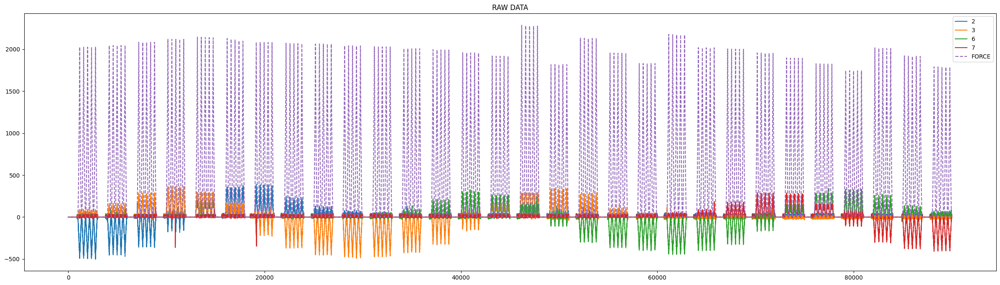

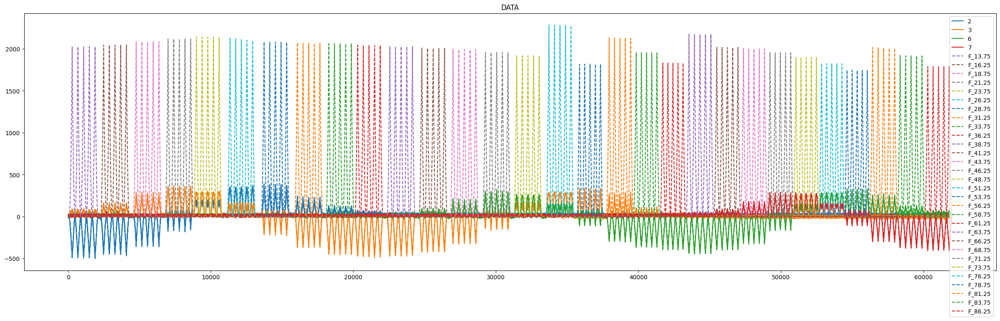

In [ ]:
import plotly.express as px
import pandas as pd
from plotly.subplots import make_subplots
import matplotlib.pylab as plt
import numpy as np

## each RAW DATA ##


## RAW DATA ##
plt.figure(figsize=(30,8))
for i in np.array(X_column):
  plt.plot(RAW_DATA[i].index, RAW_DATA[i],label=i)
for i in np.array(['FORCE']):
  plt.plot(RAW_DATA[i].index, RAW_DATA[i],label=i,linestyle = '--')
plt.legend(loc='upper right')
plt.title("RAW DATA")
plt.show()


## DATA ## RAW_DATA 에서 Outlier 제거, 눌리는 행만 추출, 힘 유지되는 구간 제거, 눌리는 위치에 힘 추가함.

plt.figure(figsize=(30,8))
for i in np.array(X_column):
  plt.plot(DATA[i].index, DATA[i],label=i)
for i in np.array(y_column): # 'FORCE','X'
  plt.plot(DATA[i].index, DATA[i] ,label=i ,linestyle = '--')
plt.legend(loc='upper right')
plt.title("DATA")
plt.show()


DATA PREPROCESSING

1. DATASET IMBALANCE -> SMOTE ???

2. NORMALIZATION
* In this example, we scale each feature using *MinMaxScaler*, where values are bounded to a range from 0 to 1

* For a given input $x$, $x_{minmax}$ = $(x-x_{min}) / (x_{max} - x_{min})$.

* For details about scaling, please read [this blog article](https://sebastianraschka.com/Articles/2014_about_feature_scaling.html).

In [ ]:
import numpy as np
import pandas as pd

# ---- 기본 컬럼 정의 ----
X_column = ['2','3','6','7']
y_column = [c for c in DATA.columns if c.startswith('F_')]

# 위치/힘 스칼라 복원
DATA_labeled = DATA.copy()
DATA_labeled['pos_idx'] = DATA_labeled[y_column].values.argmax(axis=1)   # 0..(NUM_y-1)
DATA_labeled['force']   = DATA_labeled[y_column].values.max(axis=1)

def smooth_rolling(x, win=9):
    """간단한 이동평균 스무딩(홀수 window 권장). 너무 작게 주면 효과 없음."""
    if win <= 1:
        return x
    w = win if win % 2 == 1 else win+1
    s = pd.Series(x).rolling(window=w, center=True, min_periods=1).mean().to_numpy()
    return s

def label_cycles_force_pattern(df_pos,
                               n_cycles=5,
                               low_q=0.15, high_q=0.60,
                               low_abs=1.0,   # 전처리의 FORCE_thd 고려
                               min_len=30,    # 한 사이클 최소 샘플 길이
                               smooth_win=9):
    """
    0→피크→0 패턴 기반 사이클 라벨링(히스테리시스).
    - df_pos: 특정 pos_idx DataFrame (시간 순서 가정)
    - n_cycles: 최대 라벨링 개수(앞에서부터 1..n)
    - low_q/high_q: 데이터 분포 기반 동적 임계치(백분위)
    - low_abs: 아주 작은 힘 절대 임계치(전처리 기준과 맞춤)
    - min_len: 너무 짧은 사이클 제거
    - smooth_win: 이동평균 윈도우(잡음 완화)
    """
    df = df_pos.copy()
    f_raw = df['force'].to_numpy()
    f = smooth_rolling(f_raw, win=smooth_win)

    # 동적 임계치(분포 기반) + 절대 하한 결합
    low_th  = max(np.quantile(f, low_q), low_abs)
    high_th = max(np.quantile(f, high_q), low_th + 1e-9)  # high>low 보장

    # 상태머신: IDLE -> RISING -> FALLING -> IDLE
    IDLE, RISING, FALLING = 0, 1, 2
    state = IDLE
    cyc_id = 0
    cycle = np.zeros(len(f), dtype=int)

    start_i = 0  # 사이클 시작 후보

    for i in range(1, len(f)):
        if state == IDLE:
            # 저역 임계치 근처에서 상승 시작
            if f[i-1] <= low_th and f[i] > low_th:
                state = RISING
                start_i = i-1

        elif state == RISING:
            # 충분히 올라오면 "눌림" 인정
            if f[i] >= high_th:
                state = FALLING  # 이후 하강 감지 대기
            # 만약 다시 low 아래로 떨어지면 노이즈였던 것으로 보고 취소
            elif f[i] < low_th:
                state = IDLE

        elif state == FALLING:
            # high 이상 구간은 계속 유지 가능
            # low 아래로 내려오면 "뗀 것"으로 간주 → 사이클 완성
            if f[i] <= low_th:
                end_i = i
                if end_i - start_i >= min_len:
                    cyc_id += 1
                    cycle[start_i:end_i+1] = cyc_id
                state = IDLE
                if cyc_id >= n_cycles:
                    break

    # 혹시 마지막 사이클이 열린 채 끝났다면(줄의 끝에서 떨어지기 전),
    # 끝까지 길이가 충분하면 사이클로 인정
    if state == FALLING and cyc_id < n_cycles:
        end_i = len(f) - 1
        if end_i - start_i >= min_len:
            cyc_id += 1
            cycle[start_i:end_i+1] = cyc_id

    # 라벨 부여
    df['cycle'] = cycle
    # 0(미라벨) 샘플은 제거하거나(권장) 그대로 둘지 결정
    df = df[df['cycle'] > 0].copy()

    # 혹시 n_cycles보다 많이 잡혔다면 앞에서부터 n_cycles만 사용
    if df['cycle'].max() > n_cycles:
        keep = df['cycle'] <= n_cycles
        df = df[keep].copy()

    return df

# ---- 위치별로 라벨링 적용 ----
DATA_labeled = (
    DATA_labeled
    .groupby('pos_idx', group_keys=False)
    .apply(label_cycles_force_pattern,
           n_cycles=5, low_q=0.15, high_q=0.60, low_abs=1.0, min_len=30, smooth_win=9)
    .reset_index(drop=True)
)

# sanity check: 각 위치(pos_idx)에서 1..5가 잘 나왔는지
print(DATA_labeled.groupby(['pos_idx','cycle']).size().unstack(fill_value=0))


cycle      1    2    3    4    5
pos_idx                         
0        362  360  360  360  359
1        374  373  373  373  373
2        376  374  374  374  374
3        375  372  372  372  371
4        342  341  340  341    0
5        372  373  369  383  367
6        365  362  363  362  361
7        360  360  361  359  360
8        360  359  359  358  357
9        353  352  352  351  351
10       358  356  356  356  356
11       359  357  356  357  357
12       359  357  358  358  357
13       356  355  355  355  354
14       355  353  352  352  351
15       383  382  380  381  381
16       346  344  345  344  344
17       361  359  360  359  359
18       315  314  313  314  314
19       314  313  312  313  313
20       338  337  337  336  336
21       325  324  323  323  323
22       320  318  318  318  318
23       315  314  313  313  314
24       309  308  308  307  308
25       307  305  306  305  306
26       306  304  304  305  304
27       333  331  330  330  330
28       3

/tmp/ipython-input-58171320.py:103: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(label_cycles_force_pattern,


In [ ]:
DATA_labeled

,2,3,4,5,6,7,F_13.75,F_16.25,F_18.75,F_21.25,...,F_71.25,F_73.75,F_76.25,F_78.75,F_81.25,F_83.75,F_86.25,pos_idx,force,cycle
0,-0.01,9.66,0.00,-6.44,-6.42,12.88,19.25,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0,19.25,1
1,-32.19,25.76,0.00,-6.44,22.52,12.88,23.06,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0,23.06,1
2,-22.56,12.90,-3.22,-6.44,16.11,6.45,27.20,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0,27.20,1
3,-12.89,6.45,0.00,-6.44,22.55,19.32,32.36,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0,32.36,1
4,-16.10,16.10,0.00,-6.44,6.45,6.45,34.02,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0,34.02,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51225,22.56,3.22,0.00,3.24,22.55,-32.22,0.00,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,61.11,29,61.11,5
51226,22.57,0.00,0.00,-3.21,12.89,-6.48,0.00,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,57.29,29,57.29,5
51227,16.13,-12.88,0.00,9.66,12.88,-16.11,0.00,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,53.57,29,53.57,5
51228,16.12,12.86,0.00,6.45,19.32,-22.56,0.00,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,49.77,29,49.77,5


In [ ]:
import matplotlib.pyplot as plt

def plot_fold(fold_id=1, pos=None, together=True):
    """
    fold_id: 1..5
    pos: 특정 위치만 보고 싶으면 정수 지정(예: 0). None이면 전체.
    together: True면 한 그림에 train/test 겹쳐 그림, False면 분리해 두 장.
    """
    test_mask  = (DATA_labeled['cycle'] == fold_id)
    train_mask = (DATA_labeled['cycle'] != fold_id)
    if pos is not None:
        test_mask  &= (DATA_labeled['pos_idx'] == pos)
        train_mask &= (DATA_labeled['pos_idx'] == pos)

    def _plot(mask, title, lwX=2.5, lwY=2.5, alpha=1.0):
        plt.figure(figsize=(30,8))
        for col in X_column:
            plt.plot(DATA_labeled.index[mask],
                     DATA_labeled.loc[mask, col],
                     label=col, linewidth=lwX, alpha=alpha)
        for col in y_column:
            plt.plot(DATA_labeled.index[mask],
                     DATA_labeled.loc[mask, col],
                     linestyle='--', linewidth=lwY, alpha=alpha)
        plt.legend(loc='upper right', ncol=2); plt.title(title); plt.show()

    if together:
        plt.figure(figsize=(30,8))
        # TRAIN(옅게)
        for col in X_column:
            plt.plot(DATA_labeled.index[train_mask],
                     DATA_labeled.loc[train_mask, col],
                     label=f"{col} (train)", alpha=0.35)
        for col in y_column:
            plt.plot(DATA_labeled.index[train_mask],
                     DATA_labeled.loc[train_mask, col],
                     linestyle='--', alpha=0.35)
        # TEST(굵게)
        for col in X_column:
            plt.plot(DATA_labeled.index[test_mask],
                     DATA_labeled.loc[test_mask, col],
                     label=f"{col} (test)", linewidth=3)
        for col in y_column:
            plt.plot(DATA_labeled.index[test_mask],
                     DATA_labeled.loc[test_mask, col],
                     linestyle='--', linewidth=3)
        ttl = f"Fold {fold_id} — TEST=cycle {fold_id}"
        if pos is not None: ttl += f" | pos={pos}"
        plt.legend(loc='upper right', ncol=2); plt.title(ttl); plt.show()
    else:
        _plot(train_mask, f"TRAIN (cycle != {fold_id})" + (f" | pos={pos}" if pos is not None else ""),
              lwX=1.5, lwY=1.5, alpha=0.6)
        _plot(test_mask, f"TEST (cycle == {fold_id})" + (f" | pos={pos}" if pos is not None else ""))


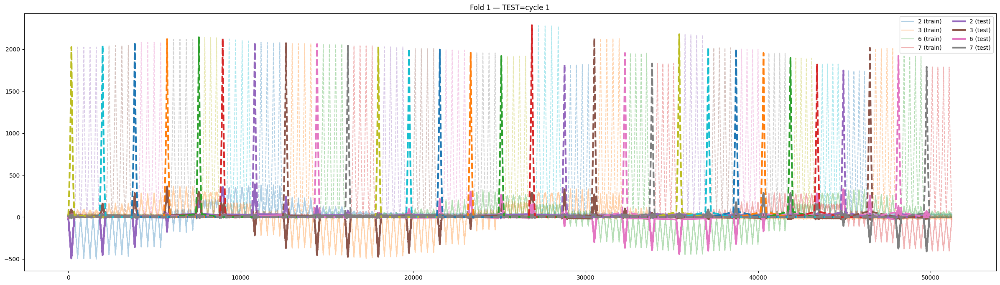

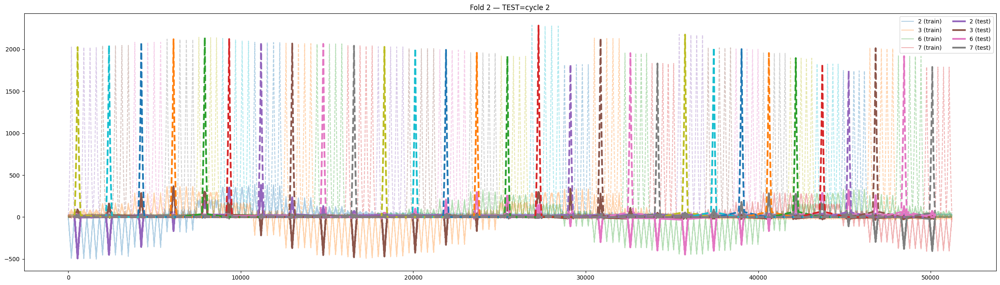

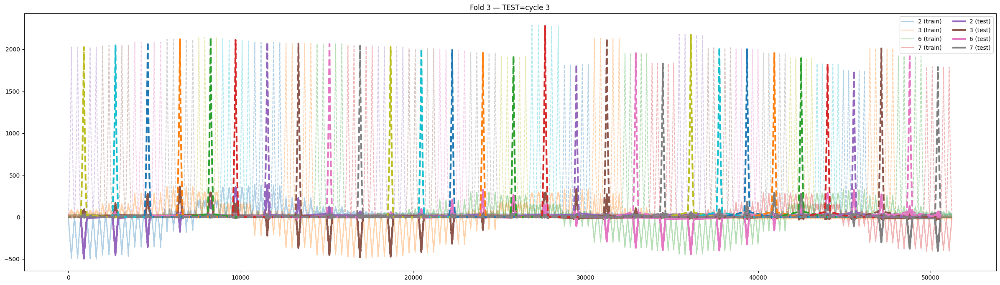

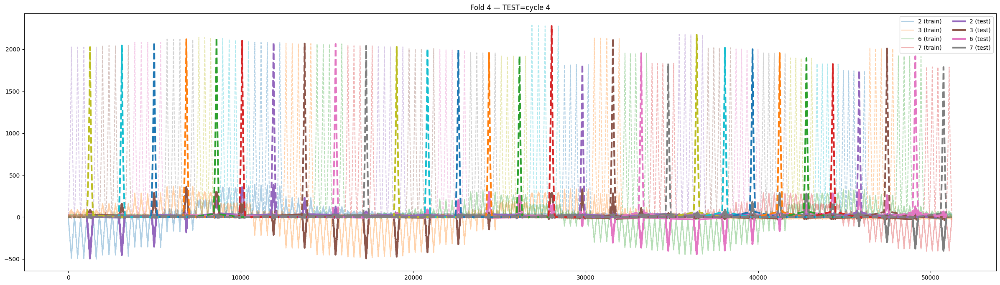

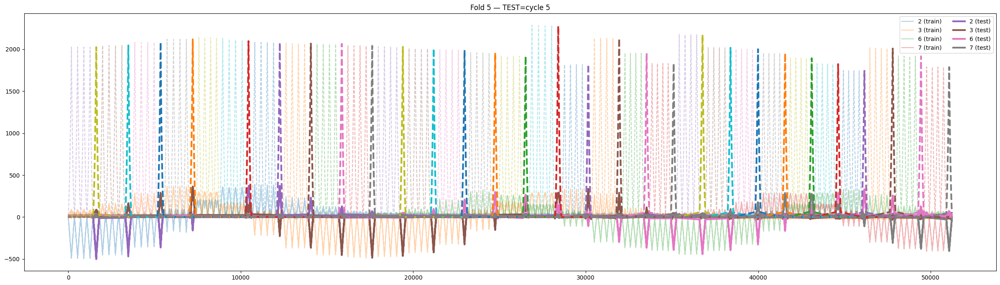

Fold 1: train=40874, test=10356, test_ratio=0.202
Fold 2: train=40920, test=10310, test_ratio=0.201
Fold 3: train=40928, test=10302, test_ratio=0.201
Fold 4: train=40918, test=10312, test_ratio=0.201
Fold 5: train=41280, test=9950, test_ratio=0.194


In [ ]:
folds = []
for k in range(1, 6):
    test_idx  = DATA_labeled.index[DATA_labeled['cycle'] == k]
    train_idx = DATA_labeled.index[DATA_labeled['cycle'] != k]
    folds.append((train_idx, test_idx))
# 예시 실행
for i in range(1,6):
  plot_fold(fold_id=i, together=True)       # 전체
# plot_fold(fold_id=1, pos=0, together=False)  # 특정 위치만 분리 그림

# folds 는 [(train_idx, test_idx), ...] 형태로 만들어져 있다고 가정
for fold_id, (tr_idx, te_idx) in enumerate(folds, start=1):
    n_train = len(tr_idx)
    n_test  = len(te_idx)
    ratio   = n_test / (n_train + n_test)
    print(f"Fold {fold_id}: train={n_train}, test={n_test}, "
          f"test_ratio={ratio:.3f}")

In [ ]:
import keras

callbacks = [
    keras.callbacks.EarlyStopping(monitor='val_root_mean_squared_error',
                                            mode='min',
                                        patience=10),
              keras.callbacks.ModelCheckpoint(monitor='val_root_mean_squared_error',
                                              mode = 'min',
                                        filepath= 'best.f5.keras', #model_path
                                        save_best_only=True,
                                        verbose = 0
                                        )
                                        ]
# EarlyStopping/ModelCheckpoint는 validation metric이 있어야 동작합니다.
early_stop = keras.callbacks.EarlyStopping(
    monitor='val_root_mean_squared_error',
    mode='min',
    patience=100,
    restore_best_weights=True
)
ckpt = keras.callbacks.ModelCheckpoint(
    monitor='val_root_mean_squared_error',
    mode='min',
    filepath='best.fold{fold_id}.keras',   # fold별로 다른 파일 이름
    save_best_only=True,
    verbose=0
)
# 예측 기록 콜백 (self.model 사용)
class PredictionHistory(keras.callbacks.Callback):
    def __init__(self, X_train_np):
        super().__init__()
        self.X_train_np = X_train_np
        self.predhis = None
    def on_epoch_end(self, epoch, logs=None):
        # 학습 중 예측 스냅샷(메모리/시간 부담되면 주석 처리)
        self.predhis = self.model.predict(self.X_train_np, verbose=0)

#Creating a Callback subclass that stores each epoch prediction
class prediction_history(keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs={}):
        self.predhis=(model_regression.predict(X_train)) # X_train_PCA

        #weights, biases = model.layers[4].get_weights()
        # print('\n')
        # print('weights : {} '.format(weights))
        # print('\n')
        # print( 'bias : {} '. format(biases))
        # print('\n')
        #print('prediction: {} at epoch: {}'.format(self.predhis, epoch))

#Calling the subclass
predictions=prediction_history()

In [ ]:
from tensorflow import keras
import tensorflow as tf
#from keras.layers.advanced_activations import LeakyReLU
from keras.layers import LeakyReLU, Softmax
from tensorflow import keras
import tensorflow as tf
from keras.layers import LeakyReLU, BatchNormalization, Dense


def build_dnn_regression() -> keras.Model:
    tf.random.set_seed(42)
    inputs = keras.Input(shape=(NUM_X,), name='input')
    x = BatchNormalization(name='bn_1')(inputs)

    x = Dense(64, kernel_regularizer='l2',
              kernel_initializer=keras.initializers.HeNormal(seed=42),
              name='Dense_1')(x)
    x = LeakyReLU(negative_slope=0.3, name='lrelu_1')(x)   # ✅ (x)

    x = BatchNormalization(name='bn_2')(x)
    x = Dense(64, kernel_regularizer='l2',
              kernel_initializer=keras.initializers.HeNormal(seed=42),
              name='Dense_2')(x)
    x = LeakyReLU(negative_slope=0.3, name='lrelu_2')(x)   # ✅ (x)

    x = BatchNormalization(name='bn_3')(x)
    outputs = Dense(NUM_y, activation='linear',
                    kernel_regularizer='l2',
                    kernel_initializer=keras.initializers.HeNormal(seed=42),
                    name='Dense_3')(x)

    return keras.Model(inputs=inputs, outputs=outputs, name='dnn_regression')

# model_regression = build_dnn_regression()
# model_regression.summary()

# model_regression.compile(
#     loss=keras.losses.MeanSquaredError(),
#                     optimizer=tf.keras.optimizers.Adam(0.01),
#     metrics=[
#           keras.metrics.RootMeanSquaredError(name="root_mean_squared_error", dtype=None),
#     ])
#optimizer=keras.optimizers.SGD(learning_rate=0.001, momentum=0.01, nesterov=False, name="SGD" # learning_rate=0.1
#),

In [ ]:
import os, re, numpy as np, pandas as pd, matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error
from mpl_toolkits.mplot3d import Axes3D  # noqa

# y컬럼명(F_18.75 등) → 실제 x좌표 배열
def extract_positions_from_ycols(y_cols):
    xs = []
    for c in y_cols:
        m = re.search(r'F_([0-9]+(?:\.[0-9]+)?)', str(c))
        xs.append(float(m.group(1)) if m else np.nan)
    if np.isnan(xs).any():  # 실패하면 0..N-1
        xs = list(range(len(y_cols)))
    return np.asarray(xs, float)

# 1D 프로파일을 y방향으로 복제해 2D 격자(두께 1cm)로
def make_2d_from_1d(profile_1d, x_positions, y_thickness_cm=1.0, ny=25):
    profile_1d = np.asarray(profile_1d).reshape(1, -1)  # (1,nx)
    Z = np.repeat(profile_1d, ny, axis=0)               # (ny,nx)
    X, Y = np.meshgrid(x_positions, np.linspace(0, y_thickness_cm, ny))
    return X, Y, Z

# 3D surface + 2D heatmap (GT/Pred 나란히)
def plot_1d_surface_and_heatmap(gt_curve, pred_curve, x_positions,
                                title="Force field", unit="N",
                                y_thickness_cm=1.0, ny=25,
                                vmin=0.0, vmax=None,
                                outpath=None):
    Xg, Yg, Zg = make_2d_from_1d(gt_curve,   x_positions, y_thickness_cm, ny)
    Xp, Yp, Zp = make_2d_from_1d(pred_curve, x_positions, y_thickness_cm, ny)
    if vmax is None:
        vmax = float(max(np.nanmax(Zg), np.nanmax(Zp)))

    fig = plt.figure(figsize=(11, 7))

    ax1 = fig.add_subplot(2,2,1, projection='3d')
    # z축 고정
    ax1.set_zlim(0, 3000)
    ax1.plot_surface(Xg, Yg, Zg, cmap='viridis', vmin=vmin, vmax=vmax, linewidth=0)
    ax1.set_title("GT (3D)"); ax1.set_xlabel("x"); ax1.set_ylabel("y (cm)"); ax1.set_zlabel(f"Force [{unit}]")

    ax2 = fig.add_subplot(2,2,2, projection='3d')
    ax2.set_zlim(0, 3000)

    ax2.plot_surface(Xp, Yp, Zp, cmap='viridis', vmin=vmin, vmax=vmax, linewidth=0)
    ax2.set_title("Pred (3D)"); ax2.set_xlabel("x"); ax2.set_ylabel("y (cm)"); ax2.set_zlabel(f"Force [{unit}]")

    # ax3 = fig.add_subplot(2,2,3)
    # im1 = ax3.imshow(Zg, origin='lower', aspect='auto', cmap='viridis', vmin=vmin, vmax=vmax,
    #                  extent=[x_positions.min(), x_positions.max(), 0, y_thickness_cm])
    # ax3.set_title("GT (heatmap)"); ax3.set_xlabel("x"); ax3.set_ylabel("y (cm)")
    # fig.colorbar(im1, ax=ax3, label=f"Force [{unit}]")

    # ax4 = fig.add_subplot(2,2,4)
    # im2 = ax4.imshow(Zp, origin='lower', aspect='auto', cmap='viridis', vmin=vmin, vmax=vmax,
    #                  extent=[x_positions.min(), x_positions.max(), 0, y_thickness_cm])
    # ax4.set_title("Pred (heatmap)"); ax4.set_xlabel("x"); ax4.set_ylabel("y (cm)")
    # fig.colorbar(im2, ax=ax4, label=f"Force [{unit}]")

    fig.suptitle(title, y=0.98)
    fig.tight_layout()
    if outpath:
        os.makedirs(os.path.dirname(outpath), exist_ok=True)
        plt.savefig(outpath, dpi=160)
        print(f"Saved: {outpath}")
    plt.show(); plt.close(fig)

from matplotlib import cm
from matplotlib.colors import Normalize
from matplotlib import cm
from matplotlib.colors import Normalize
import numpy as np
import os
import matplotlib.pyplot as plt

def plot_1d_surface_and_heatmap(gt_curve, pred_curve, x_positions,
                                title="Force field", unit="N",
                                y_thickness_cm=1.0, ny=25,
                                vmin=0.0, vmax=None,   # vmax는 z축 고정용으로만 사용
                                outpath=None):
    Xg, Yg, Zg = make_2d_from_1d(gt_curve,   x_positions, y_thickness_cm, ny)
    Xp, Yp, Zp = make_2d_from_1d(pred_curve, x_positions, y_thickness_cm, ny)

    # 색상 스케일: 0~2000만 매핑, 초과는 빨강으로 클리핑
    norm = Normalize(vmin=0.0, vmax=2000.0, clip=True)
    cmap = cm.get_cmap('jet')  # 파랑→초록→노랑→빨강 (상단이 빨강)

    fig = plt.figure(figsize=(8.5, 6.5))
    ax = fig.add_subplot(1,1,1, projection='3d')

    # z축 고정
    ax.set_zlim(0, 3000)

    # --- GT surface (더 진하게) ---
    colors_gt = cmap(norm(Zg))
    colors_gt[..., -1] = 0.55  # alpha
    ax.plot_surface(Xg, Yg, Zg, facecolors=colors_gt, linewidth=0, antialiased=False)

    # --- Pred surface (반투명으로 겹치기) ---
    colors_pr = cmap(norm(Zp))
    colors_pr[..., -1] = 0.95  # alpha
    ax.plot_surface(Xp, Yp, Zp, facecolors=colors_pr, linewidth=0, antialiased=False)

    # 축/타이틀
    ax.set_title("GT & Pred (3D overlapped)")
    ax.set_xlabel("x")
    ax.set_ylabel("y (cm)")
    ax.set_zlabel(f"Force [{unit}]")

    # 우측 바깥 컬러바 (0~2000 범위)
    mappable = cm.ScalarMappable(norm=norm, cmap=cmap)
    mappable.set_array([])  # 3D에서도 colorbar 생성용
    cbar = fig.colorbar(mappable, ax=ax, location='right', pad=0.12, shrink=0.8)
    cbar.set_label(f"Force [{unit}]")
    cbar.set_ticks([0, 500, 1000, 1500, 2000])

    fig.suptitle(title, y=0.98)
    fig.tight_layout()

    if outpath:
        os.makedirs(os.path.dirname(outpath), exist_ok=True)
        plt.savefig(outpath, dpi=160)
        print(f"Saved: {outpath}")

    plt.show()
    plt.close(fig)


# 테스트세트에서 (pos_idx, force) 조건으로 행 선택
def pick_rows_by_pos_force(meta_df, pos_idx, force_value, f_tol=1e-3):
    # pos_idx는 정수 매칭, force는 허용오차로 근접 매칭
    cond = (meta_df['pos_idx'] == pos_idx) & (meta_df['force'].sub(force_value).abs() <= f_tol)
    return meta_df.index[cond]




Fold 1
Counts: train=40874, test=10356, test_ratio=0.202
160/160 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 29777.1953 - root_mean_squared_error: 172.5479
[Fold 1] RMSE = 172.551473


/tmp/ipython-input-763983551.py:85: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('jet')  # 파랑→초록→노랑→빨강 (상단이 빨강)


Saved: plots_field/fold1_pos15_F0.0.png


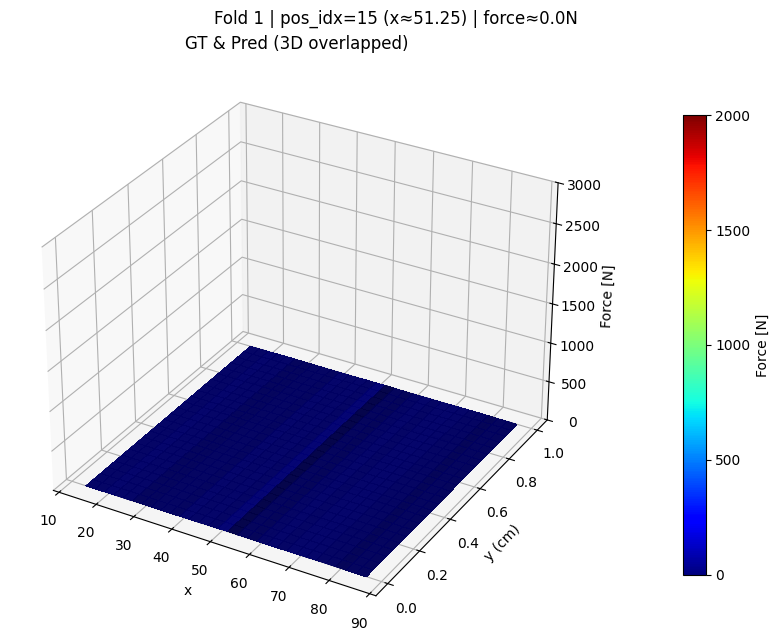

Saved: plots_field/fold1_pos15_F500.0.png


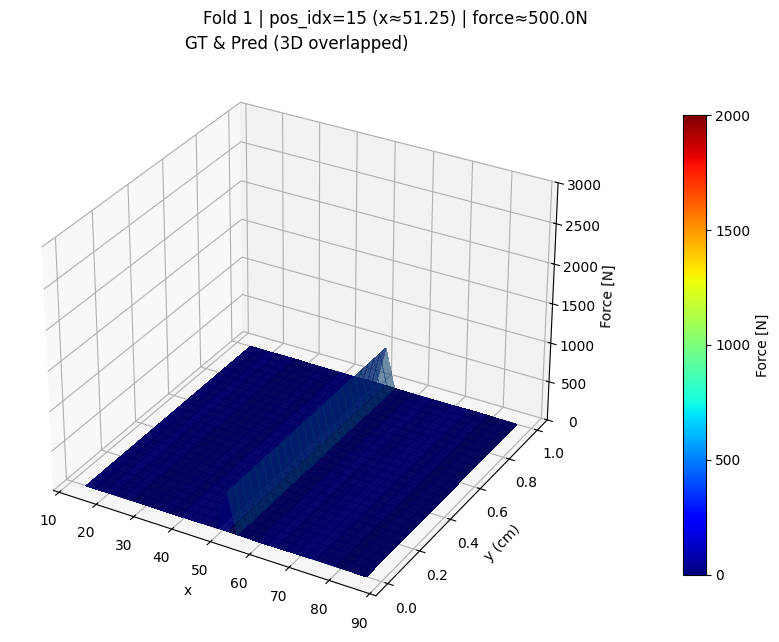

Saved: plots_field/fold1_pos15_F1000.0.png


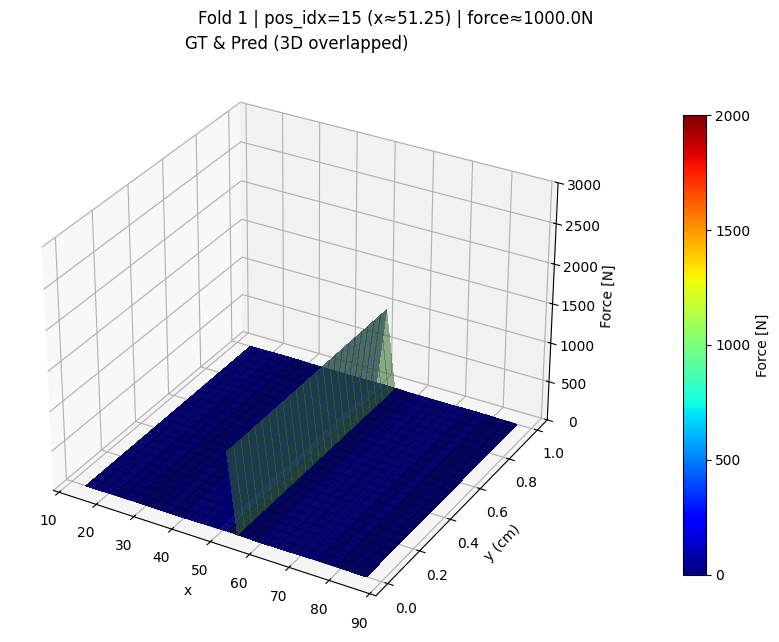


------------------------------------------------------------

Summary (counts by fold):
 fold  n_train  n_test  test_ratio
    1    40874   10356    0.202147

Avg test_ratio = 0.202

Per-fold RMSE:
  Fold 1: 172.551473
Mean RMSE: 172.551473


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow import keras
from keras.layers import LeakyReLU
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from tensorflow.keras import backend as K

# --- 기본 준비 (이미 있으리라 가정) ---
# DATA_labeled: 사이클 라벨까지 붙은 데이터프레임
# folds: [(train_idx, test_idx), ...]  # fold1~5
# X_column = ['2','3','6','7']
# y_column = [c for c in DATA_labeled.columns if c.startswith('F_')]

def normalize_train_minmax(X_train: pd.DataFrame, X_test: pd.DataFrame, feature_names):
    """
    Train에 fit한 MinMaxScaler로 X_train, X_test를 transform하고
    인덱스/컬럼을 원래대로 복원.
    """
    scaler = MinMaxScaler()
    scaler.fit(X_train[feature_names])

    Xt = scaler.transform(X_train[feature_names])
    Xv = scaler.transform(X_test[feature_names])

    X_train_norm = pd.DataFrame(Xt, index=X_train.index, columns=feature_names)
    X_test_norm  = pd.DataFrame(Xv, index=X_test.index,  columns=feature_names)
    return X_train_norm, X_test_norm, scaler

def describe_minmax(name, Xdf, feature_names):
    """
    각 컬럼별 min/max 출력. Train은 보통 0~1 (상수 특성 제외),
    Test는 범위 밖(<0, >1) 가능.
    """
    print(f"\n[{name}] shape={Xdf.shape}")
    for i, col in enumerate(feature_names):
        col_min = float(np.min(Xdf[col].values))
        col_max = float(np.max(Xdf[col].values))
        print(f"  - {col:>8s}: min={col_min: .4f}, max={col_max: .4f}")

def scatter_set(ax, X_or_y, cols, title, ylabel, legend_cols):
    for c in cols:
        ax.scatter(X_or_y[c].index, X_or_y[c].values, s=6, label=c)
    ax.set_xlabel("sample_idx")
    ax.set_ylabel(ylabel)
    ax.set_title(title)
    ax.legend(legend_cols, loc='lower right')

# ---------- Fold 루프 ----------
all_fold_stats = []
RMSE_per_fold = []

for fold_id, (train_idx, test_idx) in enumerate(folds, start=1):
    print("\n" + "="*80)
    print(f"Fold {fold_id}")

    # X, y 구성
    X = DATA_labeled.loc[:, X_column]
    y = DATA_labeled.loc[:, y_column]  # (다중타깃이거나 one-hot force-채널 구조)

    X_train = X.loc[train_idx]
    X_test  = X.loc[test_idx]
    y_train = y.loc[train_idx]
    y_test  = y.loc[test_idx]

    # 갯수 체크 (대략 4:1인지)
    n_train, n_test = len(X_train), len(X_test)
    test_ratio = n_test / (n_train + n_test)
    print(f"Counts: train={n_train}, test={n_test}, test_ratio={test_ratio:.3f}")
    # --- NORMALIZATION (train 기준 MinMax) ---
    X_train_norm, X_test_norm, scaler = normalize_train_minmax(X_train, X_test, X_column)

    # # 결과 확인 (분포)
    # describe_minmax("X_train_norm", X_train_norm, X_column)
    # describe_minmax("X_test_norm",  X_test_norm,  X_column)

    # 필요하다면 정규화된 것을 학습입력으로 교체
    X_train_use = X_train_norm
    X_test_use  = X_test_norm

    # # ---------- 시각화 ----------
    # # 1) X train (정규화 후)
    # fig, ax = plt.subplots(figsize=(30, 6))
    # scatter_set(ax, X_train_use, X_column, f"[Fold {fold_id}] X_train (normalized by train)", "(V-V0) [scaled 0..1]", X_column)
    # plt.show()

    # # 2) y train (원 스케일) — y는 정규화하지 않았다는 가정 (필요시 y도 별도 스케일링)
    # fig, ax = plt.subplots(figsize=(30, 6))
    # scatter_set(ax, y_train, y_column, f"[Fold {fold_id}] y_train", "force / channels", y_column)
    # plt.show()

    # # 3) X test (정규화 후)
    # fig, ax = plt.subplots(figsize=(30, 6))
    # scatter_set(ax, X_test_use, X_column, f"[Fold {fold_id}] X_test (normalized by train)", "(V-V0) [scaled ~0..1]", X_column)
    # plt.show()

    # # 4) y test (원 스케일)
    # fig, ax = plt.subplots(figsize=(30, 6))
    # scatter_set(ax, y_test, y_column, f"[Fold {fold_id}] y_test", "force / channels", y_column)
    # plt.show()

    # ---------- Fold별 통계 저장(원하면 나중에 표/CSV로) ----------
    all_fold_stats.append({
        "fold": fold_id,
        "n_train": n_train,
        "n_test": n_test,
        "test_ratio": test_ratio
    })

    # ---- NumPy로 변환 (Keras 입력) ----
    Xtr_np, Xte_np = X_train_norm.values, X_test_norm.values
    ytr_np, yte_np = y_train.values, y_test.values

    # ---- Model ----
    K.clear_session()
    model_regression = build_dnn_regression()
    # fold별로 checkpoint 파일명이 달라지도록 콜백 갱신
    # ckpt_fold = keras.callbacks.ModelCheckpoint(
    #     monitor='val_root_mean_squared_error',
    #     mode='min',
    #     filepath=f'best.fold{fold_id}.keras',
    #     save_best_only=True,
    #     verbose=0
    # )
    # model_regression.summary()
    model_regression.compile(
        loss=keras.losses.MeanSquaredError(),
                        optimizer=tf.keras.optimizers.Adam(0.001),
        metrics=[
              keras.metrics.RootMeanSquaredError(name="root_mean_squared_error", dtype=None),
        ])
    predhist = PredictionHistory(Xtr_np)

    # ---- Train ----
    history = model_regression.fit(
        x=Xtr_np,
        y=ytr_np,
        batch_size=256,
        epochs=1, ##############
        # validation_split=0.0,          # ★ 중요: val metric 필요
        shuffle=True,
        callbacks=[predhist], # early_stop, ckpt_fold
        verbose=1
    )

    # ---- Test ----
    y_pred = model_regression.predict(Xte_np, verbose=0)
    rmse = mean_squared_error(yte_np, y_pred)**0.5  # multioutput 평균 RMSE
    print(f"[Fold {fold_id}] RMSE = {rmse:.6f}")
    RMSE_per_fold.append(rmse)
    # ====== (여기부터 시각화) ======
    # 1) DF 준비
    y_test_df = pd.DataFrame(y_test.values, index=y_test.index, columns=y_column)
    y_pred_df = pd.DataFrame(y_pred,       index=y_test.index, columns=y_column)
    x_positions = extract_positions_from_ycols(y_column)  # 예: [13.75, 16.25, ...]

    # 2) 테스트 메타(눌린 위치, 가한 힘) – 원본 프레임에서 가져오기
    meta_test = DATA_labeled.loc[test_idx, ['pos_idx', 'force']]

    # 3) pos_idx ↔ 실제 x좌표 매핑(보고용)
    pos_idx_to_x = dict(enumerate(x_positions))  # 0→13.75, 1→16.25, ...
    # 역매핑이 필요하면:
    # x_to_pos_idx = {x:i for i,x in enumerate(x_positions)}

    # 4) 원하는 위치/힘 레벨 지정
    target_pos_idx = 15            # 예: 15번 위치(필요에 맞게 변경)
    force_levels = [0.0, 5.0*100., 10.0*100.]

    # 5) 레벨별로 평균 프로파일을 GT/Pred로 그림
    for F in force_levels:
        idx = pick_rows_by_pos_force(meta_test, pos_idx=target_pos_idx, force_value=F, f_tol=10) # 1e-3
        if len(idx) == 0:
            print(f"[Fold {fold_id}] pos_idx={target_pos_idx}, force≈{F}N 샘플이 없습니다.")
            continue

        gt_curve   = y_test_df.loc[idx].mean(axis=0).values
        pred_curve = y_pred_df.loc[idx].mean(axis=0).values
        x_label = pos_idx_to_x.get(target_pos_idx, target_pos_idx)

        plot_1d_surface_and_heatmap(
            gt_curve, pred_curve, x_positions,
            title=f"Fold {fold_id} | pos_idx={target_pos_idx} (x≈{x_label}) | force≈{F}N",
            unit="N", y_thickness_cm=1.0, ny=25,
            vmin=0.0, vmax=3000,  # 여러 그림을 동일 스케일로 비교하려면 vmax를 고정값으로
            outpath=f"plots_field/fold{fold_id}_pos{target_pos_idx}_F{F}.png"
        )
    # ====== 시각화 끝 ======
    break
# =======================
# 4) 요약 출력
# =======================
print("\n" + "-"*60)

# 전체 요약
print("\nSummary (counts by fold):")
summary_df = pd.DataFrame(all_fold_stats)
print(summary_df.to_string(index=False))
print(f"\nAvg test_ratio = {summary_df['test_ratio'].mean():.3f}")

print("\nPer-fold RMSE:")
for i, r in enumerate(RMSE_per_fold, 1):
    print(f"  Fold {i}: {r:.6f}")
print(f"Mean RMSE: {np.mean(RMSE_per_fold):.6f}")



In [ ]:
x_positions

array([13.75, 16.25, 18.75, 21.25, 23.75, 26.25, 28.75, 31.25, 33.75,
       36.25, 38.75, 41.25, 43.75, 46.25, 48.75, 51.25, 53.75, 56.25,
       58.75, 61.25, 63.75, 66.25, 68.75, 71.25, 73.75, 76.25, 78.75,
       81.25, 83.75, 86.25])

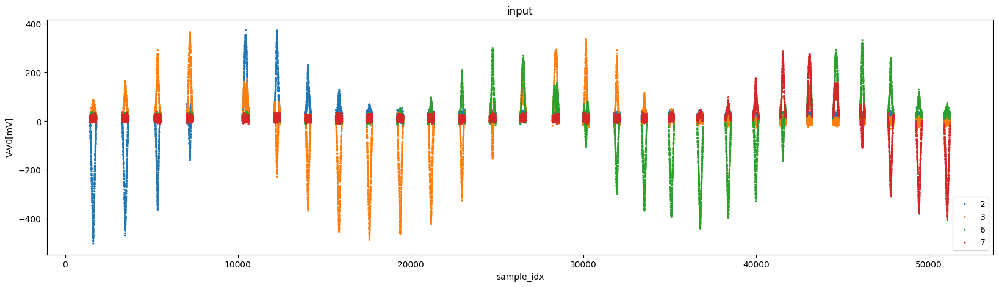

311/311 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


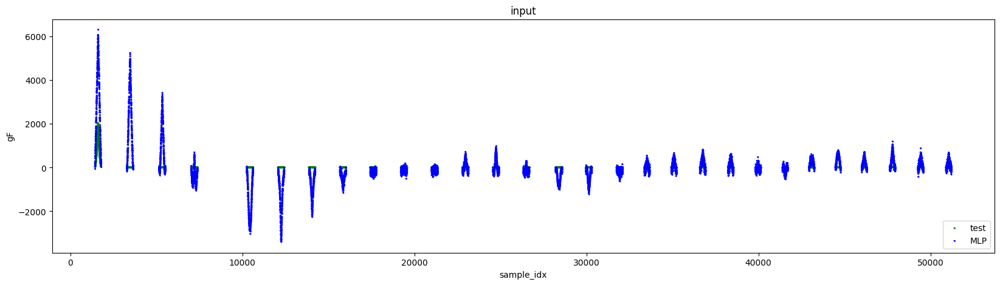

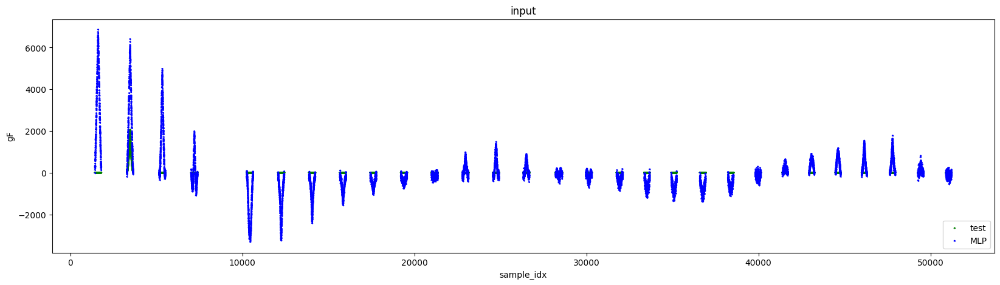

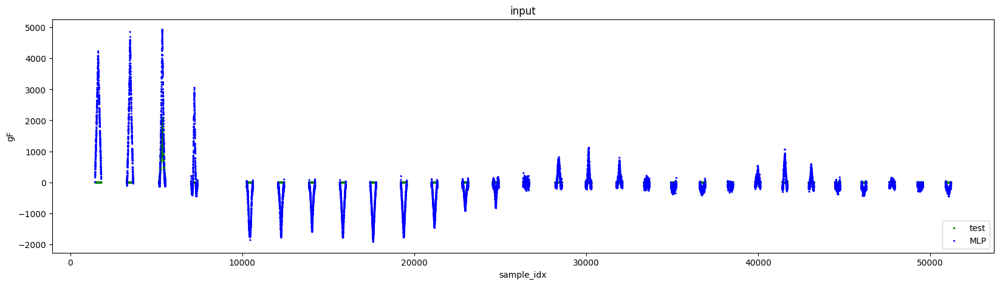

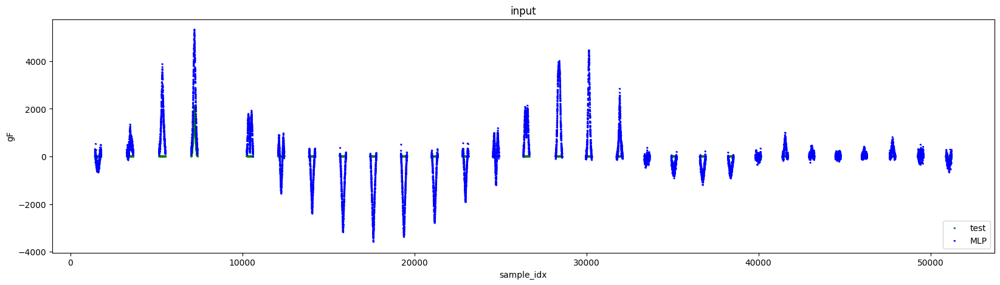

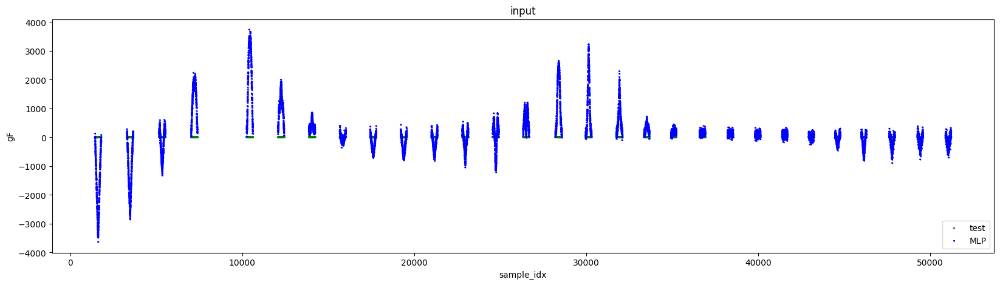

...

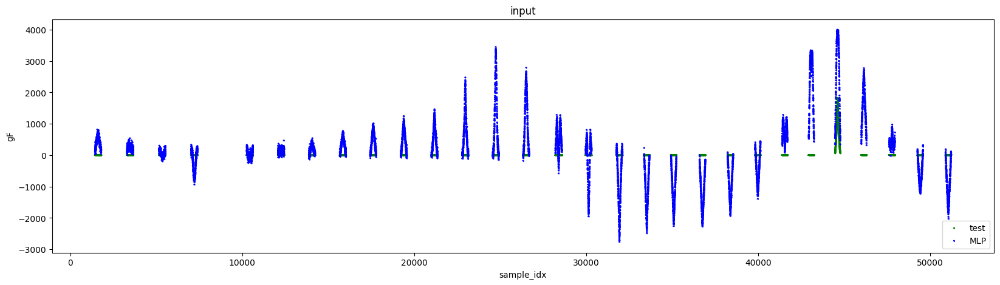

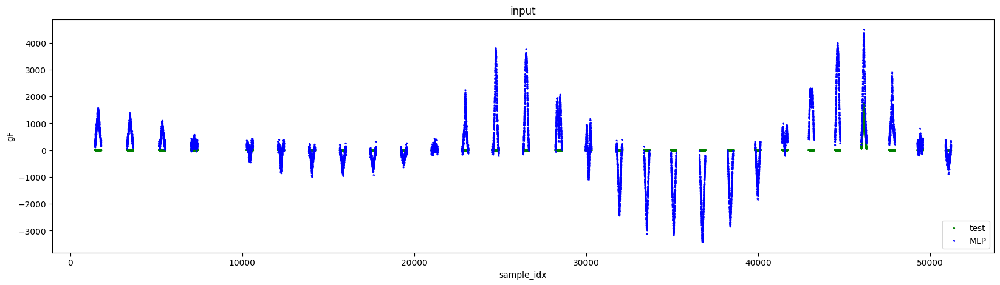

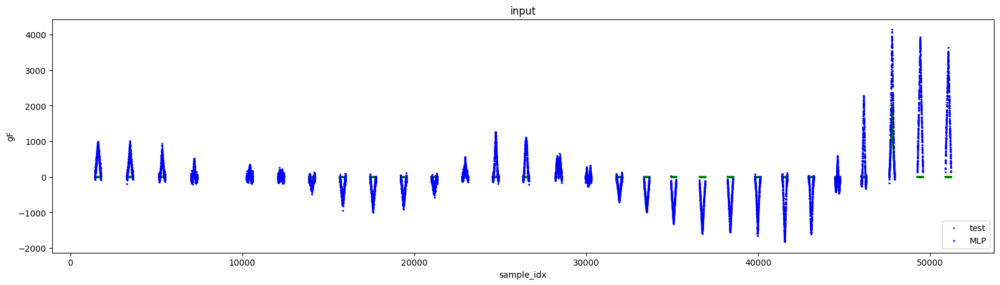

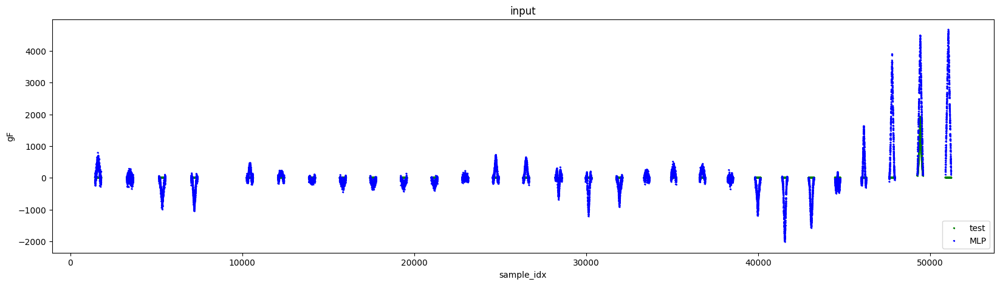

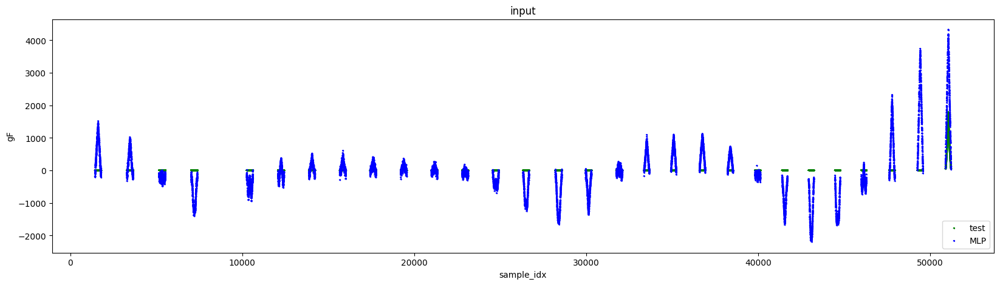

RMSE
1008.9525276865056


In [ ]:
import matplotlib.pyplot as plt # FORCE
from sklearn.metrics import mean_squared_error

import matplotlib.pyplot as plt # FORCE
from sklearn.metrics import mean_squared_error


y_test.index.names = ['idx']

X_test = pd.DataFrame(X_test)#.toDataFrame()
X_test['idx'] = y_test.index
X_test = X_test.set_index('idx')
X_test

## visualization

# ideal input
plt.figure(figsize=(20,5))
for i in np.array(X_column): # 1
  plt.scatter(X_test.index,X_test[i], s=2,linestyle = '--')
  plt.xlabel('sample_idx')
  plt.ylabel('V-V0[mV]')
  plt.legend(X_column, loc='lower right') # ,'2_2'
  plt.title('input')
plt.show()


# final prediction from noisy input 비교

pred = model_regression.predict(X_test)
pred = pd.DataFrame(pred)
pred['idx'] = y_test.index
pred = pred.set_index('idx')


# for i,col in enumerate(np.array(y.columns)): # 1
#   plt.figure(figsize=(20,5))
#   plt.scatter(pred2.index,pred2[i],linestyle = '--',color = 'r')
#   plt.scatter(y_test.index,y_test[col],color = 'g')
#   plt.xlabel('sample_idx')
#   plt.ylabel('FORCE [gf]')
#   plt.legend(['prediction', 'GT'], loc='lower right')
#   plt.title('prediction vs truth : FORCE')
#   plt.show()

## noisy input test data, decoded data, input test data
for i,col in enumerate(np.array(y.columns)): # 1
  plt.figure(figsize=(20,5))
  plt.scatter(y_test.index,y_test[col], s=2,color='g',linestyle = '--')
  plt.scatter(pred.index,pred[i], s=2,linestyle = '--',color = 'b')
  plt.xlabel('sample_idx')
  plt.ylabel('gF')
  plt.legend(['test','MLP'], loc='lower right') # ,'2_2'
  plt.title('input')
  plt.show()


## evaluation

#loss , mse = model_regression.evaluate(X_test,y_test)
print("RMSE")
print(mean_squared_error(y_test, pred)**0.5)


In [ ]:
###############
## animation ##
###############
from matplotlib.animation import FuncAnimation
from matplotlib import animation, rc

ratio = 10 # figure 사이즈 조정
y_test_sorted = y_test.copy().sort_index()
y_test_sorted = y_test_sorted.reset_index(drop=True)

pred_sorted = pred.copy().sort_index()
pred_sorted = pred_sorted.reset_index(drop=True)

fig = plt.figure(figsize=(130/ratio, 12/ratio))#, dpi=1920/16)
plt.legend(['GT','MLP'],loc='lower left')
ln, = plt.plot([], [], 'g')
ln2, = plt.plot([], [], 'r')

def init():
    plt.axis([0,  100, -100, 2300])
    return ln,ln2

def update(frame):
    xdata = xs #.append(frame)
    ydata = y_test_sorted.loc[frame]#.append(np.sin(frame))
    ln.set_data(xdata, ydata)

    xdata2 = xs #.append(frame)
    ydata2 = pred_sorted.loc[frame] #.append(np.cos(frame))
    ln2.set_data(xdata2,ydata2)

    return ln,ln2

ani = FuncAnimation(fig, update, frames=len(y_test),
                    init_func=init,interval=20, blit=True)

rc('animation', html='html5')

ani